# Our World in Data - Covid dataset

The dataset can be found [here](https://ourworldindata.org/coronavirus).

## Description

The data consists of various parameters from the Covid-19. We attempt to preprocess the data and clean up in a way that we deem fit.

## Load and Explore the data

In [1]:
import numpy as np
import pandas as pd
import os

In [2]:
data = pd.read_csv(r'owid_covid_data.csv')
data.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN


In [3]:
data.shape

(230709, 67)

There are a large number of columns. Check the columns names:

In [4]:
data.columns.values

array(['iso_code', 'continent', 'location', 'date', 'total_cases',
       'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate',
       'icu_patients', 'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units',
       'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'total_boosters', 'new_vaccinations',
       'new_vaccinations_smoothed', 't

Capitalize all the column names:

In [5]:
data.columns = map(str.title, data.columns)
data.columns

Index(['Iso_Code', 'Continent', 'Location', 'Date', 'Total_Cases', 'New_Cases',
       'New_Cases_Smoothed', 'Total_Deaths', 'New_Deaths',
       'New_Deaths_Smoothed', 'Total_Cases_Per_Million',
       'New_Cases_Per_Million', 'New_Cases_Smoothed_Per_Million',
       'Total_Deaths_Per_Million', 'New_Deaths_Per_Million',
       'New_Deaths_Smoothed_Per_Million', 'Reproduction_Rate', 'Icu_Patients',
       'Icu_Patients_Per_Million', 'Hosp_Patients',
       'Hosp_Patients_Per_Million', 'Weekly_Icu_Admissions',
       'Weekly_Icu_Admissions_Per_Million', 'Weekly_Hosp_Admissions',
       'Weekly_Hosp_Admissions_Per_Million', 'Total_Tests', 'New_Tests',
       'Total_Tests_Per_Thousand', 'New_Tests_Per_Thousand',
       'New_Tests_Smoothed', 'New_Tests_Smoothed_Per_Thousand',
       'Positive_Rate', 'Tests_Per_Case', 'Tests_Units', 'Total_Vaccinations',
       'People_Vaccinated', 'People_Fully_Vaccinated', 'Total_Boosters',
       'New_Vaccinations', 'New_Vaccinations_Smoothed',
       'T

In [6]:
data.head(3)

,Iso_Code,Continent,Location,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,...,Male_Smokers,Handwashing_Facilities,Hospital_Beds_Per_Thousand,Life_Expectancy,Human_Development_Index,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN


Rename Location to Country - it makes more sense:

In [7]:
data.rename(columns=({'Location': 'Country'}), inplace=True)
data.head(2)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,...,Male_Smokers,Handwashing_Facilities,Hospital_Beds_Per_Thousand,Life_Expectancy,Human_Development_Index,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,37.746,0.5,64.83,0.511,40099462.0,NaN,NaN,NaN,NaN


## Drop relatively unimportant features

We now check which columns we can drop. If we assume that our analysis focuses primarily on the disease only and do not have to be based on the socio-economic factors, we can hope to drop columns such as 'GDP per capita', 'Stringency index', 'Handwashing facilities' (we drop this, although one could argue that this feature could be of importance) and Human development Index. 

In [8]:
data.drop(['Gdp_Per_Capita', 'Stringency_Index', 'Handwashing_Facilities', 'Human_Development_Index'], axis=1, inplace=True)
data.head(3)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,...,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN


In [9]:
data.shape

(230709, 63)

We have now dropped the four columns which we hypothetically considered to be of least importance. Now, we describe the data:

In [10]:
data.describe()

,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,...,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
count,2.176140e+05,2.173530e+05,2.161570e+05,1.984020e+05,198351.000000,197171.000000,216620.000000,216359.000000,215168.000000,197421.000000,...,195467.000000,140762.000000,138835.000000,165481.000000,212025.000000,2.297150e+05,7.766000e+03,7766.000000,7817.000000,7766.000000
mean,4.464512e+06,1.235520e+04,1.239325e+04,7.418800e+04,137.914631,138.569101,60641.109884,188.572587,189.015256,692.984331,...,8.387054,10.676382,32.810232,3.088873,73.619435,1.398915e+08,4.796967e+04,9.963914,14.325741,1352.302239
std,2.789428e+07,8.516900e+04,8.322884e+04,3.813783e+05,728.466656,714.038557,107254.770354,1048.037875,665.469480,978.132307,...,4.734615,10.627353,13.534937,2.552194,7.446684,6.874368e+08,1.325850e+05,13.541548,26.390612,1735.666231
min,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000,0.000000,0.001000,0.000000,0.000000,0.000000,...,0.990000,0.100000,7.700000,0.100000,53.280000,4.700000e+01,-3.772610e+04,-28.450000,-95.920000,-1884.678982
25%,4.396500e+03,0.000000e+00,6.000000e+00,1.130000e+02,0.000000,0.000000,1102.724000,0.000000,1.320000,29.400000,...,5.310000,1.900000,21.600000,1.300000,69.500000,8.960070e+05,3.460000e+01,0.560000,-0.120000,27.051515
50%,4.948900e+04,5.300000e+01,9.357100e+01,1.180000e+03,1.000000,1.429000,10428.945500,7.407000,19.164000,214.564000,...,7.200000,6.300000,31.400000,2.500000,75.050000,6.885868e+06,6.009500e+03,7.385000,7.270000,807.128549
75%,5.239610e+05,9.530000e+02,1.123429e+03,9.798750e+03,14.000000,15.714000,72897.929250,96.569500,135.209250,1025.105000,...,10.590000,19.300000,41.300000,4.200000,79.070000,3.298164e+07,3.471957e+04,15.607500,19.770000,2109.735183
max,6.294387e+08,4.081967e+06,3.436031e+06,6.586643e+06,17731.000000,14857.714000,665504.845000,195005.313000,36401.607000,6432.774000,...,30.530000,44.000000,78.100000,13.800000,86.750000,7.909295e+09,1.224011e+06,76.550000,376.580000,9771.680201


We see the count varying across the columns. So we have to check the count for each of the columns, since values seem to be missing in some of these columns:

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230709 entries, 0 to 230708
Data columns (total 63 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Iso_Code                                    230709 non-null  object 
 1   Continent                                   217685 non-null  object 
 2   Country                                     230709 non-null  object 
 3   Date                                        230709 non-null  object 
 4   Total_Cases                                 217614 non-null  float64
 5   New_Cases                                   217353 non-null  float64
 6   New_Cases_Smoothed                          216157 non-null  float64
 7   Total_Deaths                                198402 non-null  float64
 8   New_Deaths                                  198351 non-null  float64
 9   New_Deaths_Smoothed                         197171 non-null  float64
 

It seems that only ISO Code, Date and Country have the complete data. We take the sum of null values to verify:

In [12]:
pd.options.display.max_rows = None
data.isna().sum()

Iso_Code                                           0
Continent                                      13024
Country                                            0
Date                                               0
Total_Cases                                    13095
New_Cases                                      13356
New_Cases_Smoothed                             14552
Total_Deaths                                   32307
New_Deaths                                     32358
New_Deaths_Smoothed                            33538
Total_Cases_Per_Million                        14089
New_Cases_Per_Million                          14350
New_Cases_Smoothed_Per_Million                 15541
Total_Deaths_Per_Million                       33288
New_Deaths_Per_Million                         33339
New_Deaths_Smoothed_Per_Million                34514
Reproduction_Rate                              59530
Icu_Patients                                  199207
Icu_Patients_Per_Million                      

Check if there are duplicated rows:

In [13]:
data = data.drop_duplicates()
data.shape

(230709, 63)

No duplicated rows. 

# Preprocessing - Country and Continent

We analyze the continents:

In [14]:
data['Continent'].unique()

array(['Asia', nan, 'Europe', 'Africa', 'North America', 'South America',
       'Oceania'], dtype=object)

In [15]:
data['Country'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswat

In [16]:
data['Continent'].value_counts().sum()

217685

In [17]:
len(data) - data['Continent'].value_counts().sum()

13024

There were no misisng values in the country column. 

In [18]:
data['Country'].value_counts().sum()

230709

We notice that there is a Country titled 'World'. Chances are there are no continents specified for this so-called 'Country'. Let's check that.

In [19]:
data.groupby('Country')['Country'].count()

Country
Afghanistan                          977
Africa                               988
Albania                              976
Algeria                              976
Andorra                              970
Angola                               952
Anguilla                             944
Antigua and Barbuda                  959
Argentina                           1031
Armenia                              998
Aruba                                959
Asia                                1010
Australia                           1006
Austria                              976
Azerbaijan                           971
Bahamas                              956
Bahrain                              977
Bangladesh                           964
Barbados                             955
Belarus                              973
Belgium                              997
Belize                               949
Benin                                956
Bermuda                              953
Bhutan  

In [20]:
data.loc[data['Country'] == 'World'][['Continent', 'Country']]

,Continent,Country
226862,NaN,World
226863,NaN,World
226864,NaN,World
226865,NaN,World
226866,NaN,World
226867,NaN,World
226868,NaN,World
226869,NaN,World
226870,NaN,World
226871,NaN,World


We cannot for certain state with conviction where this data originated from, and therefore, these rows probably do not contribute to the data meaniningfully. Thus, we choose to drop these rows:

In [21]:
idx = data[data.Country == 'World'].index
idx

Int64Index([226862, 226863, 226864, 226865, 226866, 226867, 226868, 226869,
            226870, 226871,
            ...
            227862, 227863, 227864, 227865, 227866, 227867, 227868, 227869,
            227870, 227871],
           dtype='int64', length=1010)

In [22]:
data.drop(idx, inplace=True)
data.shape

(229699, 63)

We check if it has indeed been dropped.

In [23]:
data.loc[data['Country'] == 'World'][['Country', 'Continent']].sum()

Country      0.0
Continent    0.0
dtype: float64

In [24]:
data['Continent'].isnull().sum()

12014

We check the same for Country titled 'International', 'Low Income', 'Upper middle income', 'High Income' and 'Lower middle Income':

In [25]:
data.loc[(data['Country'] == 'International') | (data['Country'] == 'Low income') | (data['Country'] == 'Lower middle income') | (data['Country'] == 'Upper middle income') | (data['Country'] == ' income')][['Continent', 'Country']]

,Continent,Country
95975,NaN,International
95976,NaN,International
95977,NaN,International
95978,NaN,International
95979,NaN,International
95980,NaN,International
95981,NaN,International
95982,NaN,International
95983,NaN,International
95984,NaN,International


We drop the corresponding rows:

In [26]:
idx = data.loc[(data['Country'] == 'International') | (data['Country'] == 'Low income') | (data['Country'] == 'Lower middle income')| (data['Country'] == 'High income') | (data['Country'] == 'Upper middle income')].index
idx

Int64Index([ 89081,  89082,  89083,  89084,  89085,  89086,  89087,  89088,
             89089,  89090,
            ...
            219599, 219600, 219601, 219602, 219603, 219604, 219605, 219606,
            219607, 219608],
           dtype='int64', length=5002)

In [27]:
data.drop(idx, inplace=True)
data.shape

(224697, 63)

Check the missing values in the continent column:

In [28]:
data['Continent'].isnull().sum()

7012

In [29]:
data['Country'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',
       'Estonia', 'Eswat

In [30]:
pd.options.display.max_rows = None
data.head(1000)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,...,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
5,AFG,Asia,Afghanistan,2020-02-29,5.0,0.0,0.714,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
6,AFG,Asia,Afghanistan,2020-03-01,5.0,0.0,0.714,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
7,AFG,Asia,Afghanistan,2020-03-02,5.0,0.0,0.000,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
8,AFG,Asia,Afghanistan,2020-03-03,5.0,0.0,0.000,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN
9,AFG,Asia,Afghanistan,2020-03-04,5.0,0.0,0.000,NaN,NaN,NaN,...,9.59,NaN,NaN,0.5,64.83,4.009946e+07,NaN,NaN,NaN,NaN


## Checkpoint 01

In [31]:
pd.options.display.max_columns = None
data_copy = data.copy()
data_copy.head()

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.125,0.125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN


## Deal with other missing values - SimpleImputer

Since the country column is mostly accounted for, we use simple imputer to assign a string 'missing_value' to the 'Continent' and 'Test_Units' columns.

For the case of all other columns, 0 will be assigned since their datatype is numeric in nature.

In [32]:
from sklearn.impute import SimpleImputer

In [33]:
imputer = SimpleImputer(missing_values=np.nan, strategy='constant')

In [34]:
df = pd.DataFrame(imputer.fit_transform(data_copy), columns=data_copy.columns)
df.head(1000)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,missing_value,missing_value,missing_value,missing_value,0.125,0.125,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_valu

## Replace missing values appropriately

For the numerical values, we replace missing_values with 0:

In [35]:
df.columns.values

array(['Iso_Code', 'Continent', 'Country', 'Date', 'Total_Cases',
       'New_Cases', 'New_Cases_Smoothed', 'Total_Deaths', 'New_Deaths',
       'New_Deaths_Smoothed', 'Total_Cases_Per_Million',
       'New_Cases_Per_Million', 'New_Cases_Smoothed_Per_Million',
       'Total_Deaths_Per_Million', 'New_Deaths_Per_Million',
       'New_Deaths_Smoothed_Per_Million', 'Reproduction_Rate',
       'Icu_Patients', 'Icu_Patients_Per_Million', 'Hosp_Patients',
       'Hosp_Patients_Per_Million', 'Weekly_Icu_Admissions',
       'Weekly_Icu_Admissions_Per_Million', 'Weekly_Hosp_Admissions',
       'Weekly_Hosp_Admissions_Per_Million', 'Total_Tests', 'New_Tests',
       'Total_Tests_Per_Thousand', 'New_Tests_Per_Thousand',
       'New_Tests_Smoothed', 'New_Tests_Smoothed_Per_Thousand',
       'Positive_Rate', 'Tests_Per_Case', 'Tests_Units',
       'Total_Vaccinations', 'People_Vaccinated',
       'People_Fully_Vaccinated', 'Total_Boosters', 'New_Vaccinations',
       'New_Vaccinations_Smoothed', 'To

In [36]:
df['Total_Cases'].replace({'missing_value':0}, inplace=True)
df.head()

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,missing_value,missing_value,missing_value,missing_value,0.125,0.125,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,54.422,18.6,2.581,1.337,missing_value,597.029,9.59,missing_value,missing_value,0.5,64.83,40099462.0,missing_value,missing_value,missing_value,missing_value
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,missing_value,missing_value,missing_value,missing_value,0.125,0.0,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_valu

In [37]:
cols = ['New_Cases', 'New_Cases_Smoothed', 'Total_Deaths', 'New_Deaths',
       'New_Deaths_Smoothed', 'Total_Cases_Per_Million',
       'New_Cases_Per_Million', 'New_Cases_Smoothed_Per_Million',
       'Total_Deaths_Per_Million', 'New_Deaths_Per_Million',
       'New_Deaths_Smoothed_Per_Million', 'Reproduction_Rate',
       'Icu_Patients', 'Icu_Patients_Per_Million', 'Hosp_Patients',
       'Hosp_Patients_Per_Million', 'Weekly_Icu_Admissions',
       'Weekly_Icu_Admissions_Per_Million', 'Weekly_Hosp_Admissions',
       'Weekly_Hosp_Admissions_Per_Million', 'Total_Tests', 'New_Tests',
       'Total_Tests_Per_Thousand', 'New_Tests_Per_Thousand',
       'New_Tests_Smoothed', 'New_Tests_Smoothed_Per_Thousand',
       'Positive_Rate', 'Tests_Per_Case',
       'Total_Vaccinations', 'People_Vaccinated',
       'People_Fully_Vaccinated', 'Total_Boosters', 'New_Vaccinations',
       'New_Vaccinations_Smoothed', 'Total_Vaccinations_Per_Hundred',
       'People_Vaccinated_Per_Hundred',
       'People_Fully_Vaccinated_Per_Hundred',
       'Total_Boosters_Per_Hundred',
       'New_Vaccinations_Smoothed_Per_Million',
       'New_People_Vaccinated_Smoothed',
       'New_People_Vaccinated_Smoothed_Per_Hundred', 'Population_Density',
       'Median_Age', 'Aged_65_Older', 'Aged_70_Older', 'Extreme_Poverty',
       'Cardiovasc_Death_Rate', 'Diabetes_Prevalence', 'Female_Smokers',
       'Male_Smokers', 'Hospital_Beds_Per_Thousand', 'Life_Expectancy',
       'Population', 'Excess_Mortality_Cumulative_Absolute',
       'Excess_Mortality_Cumulative', 'Excess_Mortality',
       'Excess_Mortality_Cumulative_Per_Million']

In [38]:
df[cols] = df[cols].replace({'missing_value':0})
df.head(100)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.000,0.0,0.0,0.000,0.125,0.125,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
5,AFG,Asia,Afghanistan,2020-02-29,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
6,AFG,Asia,Afghanistan,2020-03-01,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
7,AFG,Asia,Afghanistan,2020-03-02,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
8,AFG,Asia,Afghanistan,2020-03-03,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0

For the nominal data, we leave them be, since it is in and of itself string:

In [39]:
df.dtypes

Iso_Code                                       object
Continent                                      object
Country                                        object
Date                                           object
Total_Cases                                   float64
New_Cases                                     float64
New_Cases_Smoothed                            float64
Total_Deaths                                  float64
New_Deaths                                    float64
New_Deaths_Smoothed                           float64
Total_Cases_Per_Million                       float64
New_Cases_Per_Million                         float64
New_Cases_Smoothed_Per_Million                float64
Total_Deaths_Per_Million                      float64
New_Deaths_Per_Million                        float64
New_Deaths_Smoothed_Per_Million               float64
Reproduction_Rate                             float64
Icu_Patients                                  float64
Icu_Patients_Per_Million    

In [40]:
df.isnull().any()

Iso_Code                                      False
Continent                                     False
Country                                       False
Date                                          False
Total_Cases                                   False
New_Cases                                     False
New_Cases_Smoothed                            False
Total_Deaths                                  False
New_Deaths                                    False
New_Deaths_Smoothed                           False
Total_Cases_Per_Million                       False
New_Cases_Per_Million                         False
New_Cases_Smoothed_Per_Million                False
Total_Deaths_Per_Million                      False
New_Deaths_Per_Million                        False
New_Deaths_Smoothed_Per_Million               False
Reproduction_Rate                             False
Icu_Patients                                  False
Icu_Patients_Per_Million                      False
Hosp_Patient

In [41]:
df.isnull().sum()

Iso_Code                                      0
Continent                                     0
Country                                       0
Date                                          0
Total_Cases                                   0
New_Cases                                     0
New_Cases_Smoothed                            0
Total_Deaths                                  0
New_Deaths                                    0
New_Deaths_Smoothed                           0
Total_Cases_Per_Million                       0
New_Cases_Per_Million                         0
New_Cases_Smoothed_Per_Million                0
Total_Deaths_Per_Million                      0
New_Deaths_Per_Million                        0
New_Deaths_Smoothed_Per_Million               0
Reproduction_Rate                             0
Icu_Patients                                  0
Icu_Patients_Per_Million                      0
Hosp_Patients                                 0
Hosp_Patients_Per_Million               

The columns containing strings are labeled "missing_values" - The columns of interest are Tests_Units and Continent. 

We replace the "missing_value" in Continent with "World", although it is not very feasible.

In [42]:
df['Continent'].replace({'missing_value': 'World'}, inplace=True)
df.head(1000)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.000,0.0,0.0,0.000,0.125,0.125,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
5,AFG,Asia,Afghanistan,2020-02-29,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
6,AFG,Asia,Afghanistan,2020-03-01,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
7,AFG,Asia,Afghanistan,2020-03-02,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.000,0.0000,0.0,missing_value,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.000,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,4.009946e+07,0.0,0.0,0.0,0.0
8,AFG,Asia,Afg

In the case of 'Tests_Units' column, we replace 'missing_value' with 'no_units':

In [43]:
df['Tests_Units'].replace({'missing_value': 'tests not performed'}, inplace=True)
df.head(100)

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,0.000,0.0,0.0,0.000,0.125,0.125,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
5,AFG,Asia,Afghanistan,2020-02-29,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
6,AFG,Asia,Afghanistan,2020-03-01,5.0,0.0,0.714,0.0,0.0,0.000,0.125,0.000,0.018,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
7,AFG,Asia,Afghanistan,2020-03-02,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,tests not performed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.422,18.6,2.581,1.337,0.0,597.029,9.59,0.0,0.0,0.5,64.83,40099462.0,0.0,0.0,0.0,0.0
8,AFG,Asia,Afghanistan,2020-03-03,5.0,0.0,0.000,0.0,0.0,0.000,0.125,0.000,0.00

We check the unique values:

In [44]:
df['Tests_Units'].unique()

array(['tests not performed', 'tests performed', 'units unclear',
       'samples tested', 'people tested'], dtype=object)

Let us assume that this is the final preprocessed dataset.

## Export the Preprocessed dataset

It is a good practice to export the dataset that we have preprocessed for further uses. We therefore export the dataset that has been preprocessed using the SimpleImputer.

In [45]:
df.to_csv(r'Preprocessed_Covid_data.csv', index=False)

## Dealing with missing values - KNNImputer

KNN Imputer maintains the value and variability of your datasets and yet it is more precise and efficient than using the average values. The drawback of KNN Imputer is that it is computationally expensive. 

To perform the KNN Imputer, two conditions must be satisfied:
1. There should be no string values. KNNImputer will generate errors if we do not change these values to numerical values. Thus, you need to perform one-hot encoding or create “dummy variables”. You can also use LabelEncoder or OrdinalEncoder.
2. KNN Imptuer is a distance-based imputation method and it requires us to normalize the data. Otherwise, the different scales of the data will lead the KNN Imputer to generate biased replacements for the missing values. 

We start by creating the dummy variable of the Tests_Units column, since it is categorical nominal:

In [46]:
cat_variables = data_copy[['Tests_Units']]
cat_dummies = pd.get_dummies(cat_variables, drop_first=True)
cat_dummies.head()

,Tests_Units_samples tested,Tests_Units_tests performed,Tests_Units_units unclear
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


We create a checkpoint to not lose the data:

In [47]:
data_copy_02 = data_copy.copy()
data_copy_02.head()

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Tests_Units,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.125,0.125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN


In [48]:
data_copy_02.drop(['Tests_Units'], axis=1, inplace=True)
data_copy_02 = pd.concat([data_copy_02, cat_dummies], axis=1)
data_copy_02.head()

,Iso_Code,Continent,Country,Date,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million,Tests_Units_samples tested,Tests_Units_tests performed,Tests_Units_units unclear
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.125,0.125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0


We do not want to convert the Date, Continent, Country and ISO Code into Dummy variables since it will increase the number of columns and  is also unnecessary. So we store those features in a separate dataframe and concatenate later, after the Imputer has been implemented:

In [49]:
cat_var = data_copy_02[['Iso_Code', 'Continent',  'Country', 'Date']]
cat_var.head()

,Iso_Code,Continent,Country,Date
0,AFG,Asia,Afghanistan,2020-02-24
1,AFG,Asia,Afghanistan,2020-02-25
2,AFG,Asia,Afghanistan,2020-02-26
3,AFG,Asia,Afghanistan,2020-02-27
4,AFG,Asia,Afghanistan,2020-02-28


We can now drop the corresponding columns:

In [50]:
df_kNN = data_copy_02.drop(['Iso_Code', 'Continent',  'Country', 'Date'], axis=1)
df_kNN.head()

,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million,Tests_Units_samples tested,Tests_Units_tests performed,Tests_Units_units unclear
0,5.0,5.0,NaN,NaN,NaN,NaN,0.125,0.125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
1,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
2,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
3,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0
4,5.0,0.0,NaN,NaN,NaN,NaN,0.125,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.422,18.6,2.581,1.337,NaN,597.029,9.59,NaN,NaN,0.5,64.83,40099462.0,NaN,NaN,NaN,NaN,0,0,0


We can then Normalize the data and apply the KNNImputer:

In [51]:
from sklearn.preprocessing import MinMaxScaler

In [52]:
scaler = MinMaxScaler()

In [53]:
df_kNN = pd.DataFrame(scaler.fit_transform(df_kNN), columns = df_kNN.columns)
df_kNN.head()

,Total_Cases,New_Cases,New_Cases_Smoothed,Total_Deaths,New_Deaths,New_Deaths_Smoothed,Total_Cases_Per_Million,New_Cases_Per_Million,New_Cases_Smoothed_Per_Million,Total_Deaths_Per_Million,New_Deaths_Per_Million,New_Deaths_Smoothed_Per_Million,Reproduction_Rate,Icu_Patients,Icu_Patients_Per_Million,Hosp_Patients,Hosp_Patients_Per_Million,Weekly_Icu_Admissions,Weekly_Icu_Admissions_Per_Million,Weekly_Hosp_Admissions,Weekly_Hosp_Admissions_Per_Million,Total_Tests,New_Tests,Total_Tests_Per_Thousand,New_Tests_Per_Thousand,New_Tests_Smoothed,New_Tests_Smoothed_Per_Thousand,Positive_Rate,Tests_Per_Case,Total_Vaccinations,People_Vaccinated,People_Fully_Vaccinated,Total_Boosters,New_Vaccinations,New_Vaccinations_Smoothed,Total_Vaccinations_Per_Hundred,People_Vaccinated_Per_Hundred,People_Fully_Vaccinated_Per_Hundred,Total_Boosters_Per_Hundred,New_Vaccinations_Smoothed_Per_Million,New_People_Vaccinated_Smoothed,New_People_Vaccinated_Smoothed_Per_Hundred,Population_Density,Median_Age,Aged_65_Older,Aged_70_Older,Extreme_Poverty,Cardiovasc_Death_Rate,Diabetes_Prevalence,Female_Smokers,Male_Smokers,Hospital_Beds_Per_Thousand,Life_Expectancy,Population,Excess_Mortality_Cumulative_Absolute,Excess_Mortality_Cumulative,Excess_Mortality,Excess_Mortality_Cumulative_Per_Million,Tests_Units_samples tested,Tests_Units_tests performed,Tests_Units_units unclear
0,1.695401e-08,0.000003,NaN,NaN,NaN,NaN,1.863247e-07,6.410082e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002642,0.10574,0.055472,0.045138,NaN,0.802514,0.291131,NaN,NaN,0.029197,0.345085,0.008544,NaN,NaN,NaN,NaN,0.0,0.0,0.0
1,1.695401e-08,0.000000,NaN,NaN,NaN,NaN,1.863247e-07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002642,0.10574,0.055472,0.045138,NaN,0.802514,0.291131,NaN,NaN,0.029197,0.345085,0.008544,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2,1.695401e-08,0.000000,NaN,NaN,NaN,NaN,1.863247e-07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002642,0.10574,0.055472,0.045138,NaN,0.802514,0.291131,NaN,NaN,0.029197,0.345085,0.008544,NaN,NaN,NaN,NaN,0.0,0.0,0.0
3,1.695401e-08,0.000000,NaN,NaN,NaN,NaN,1.863247e-07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002642,0.10574,0.055472,0.045138,NaN,0.802514,0.291131,NaN,NaN,0.029197,0.345085,0.008544,NaN,NaN,NaN,NaN,0.0,0.0,0.0
4,1.695401e-08,0.000000,NaN,NaN,NaN,NaN,1.863247e-07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002642,0.10574,0.055472,0.045138,NaN,0.802514,0.291131,NaN,NaN,0.029197,0.345085,0.008544,NaN,NaN,NaN,NaN,0.0,0.0,0.0


We now perform the KNN Imputation.



The kNN Imputer is not implemented here because it is computationally expensive:



```
from sklearn.impute import KNNImputer
imputer = KNNImputer(missing_values=np.nan, n_neighbors=5)
imputer.get_params()
df2 = pd.DataFrame(imputer.fit_transform(df_kNN), columns=df_kNN.columns)
df2.head(5)
```
Remember that we need to concatenate the previously removed columns to the df2 DataFrame!


## Working with the preprocessed Dataset

Let us find the top 5 countries with maximum deaths:

In [54]:
df.groupby('Country')['Total_Deaths'].max().sort_values(ascending=False).head(5)

Country
Europe            1960408.0
North America     1525189.0
Asia              1491525.0
South America     1332032.0
European Union    1160632.0
Name: Total_Deaths, dtype: float64

As seen, Europe, North America and Asia are the top three 'Countries' where largest number of deaths due to Covid has occured. One could argue that this may include data from a collective list of countries since the three categories consist of a large number of countries.

We check if we can derive any useful information from the plot between New cases and ICU patients:

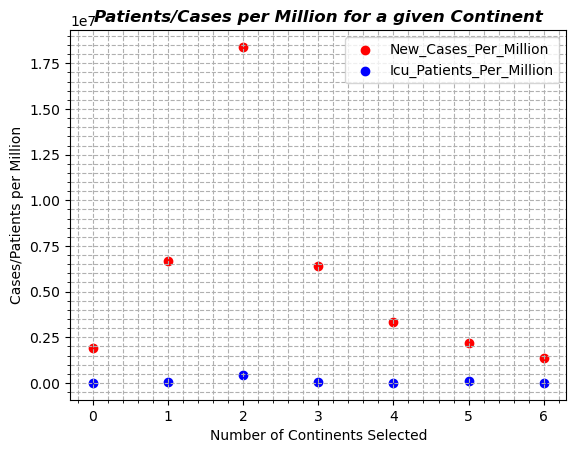

In [55]:
vax_case = df.groupby('Continent')[['Continent', 'New_Cases_Per_Million', 'Icu_Patients_Per_Million']].sum().reset_index()
import matplotlib.pyplot as plt
plt.scatter(np.arange(0, len(vax_case)), vax_case['New_Cases_Per_Million'], color='r', label='New_Cases_Per_Million')
plt.scatter(np.arange(0, len(vax_case)), vax_case['Icu_Patients_Per_Million'], color='b', label='Icu_Patients_Per_Million')
plt.legend()
plt.xlabel('Number of Continents Selected')
plt.ylabel('Cases/Patients per Million')
plt.title('Patients/Cases per Million for a given Continent', fontstyle='oblique', fontsize=12, fontweight='bold', loc='center')
plt.minorticks_on()
plt.grid(visible=True, which='both', linestyle='--')
plt.show()

It is not possible to visualize a trend from this graph without further analysis. We now analyse the data by grouping date and country together:

In [56]:
date_country = df.groupby(['Date', 'Country'])[['Date','Country','Total_Cases','Total_Deaths','Total_Vaccinations']].sum().reset_index()
date_country.head(100)

,Date,Country,Total_Cases,Total_Deaths,Total_Vaccinations
0,2020-01-01,Argentina,0.0,0.0,0.0
1,2020-01-01,Mexico,0.0,0.0,0.0
2,2020-01-02,Argentina,0.0,0.0,0.0
3,2020-01-02,Mexico,0.0,0.0,0.0
4,2020-01-03,Argentina,0.0,0.0,0.0
5,2020-01-03,Mexico,0.0,0.0,0.0
6,2020-01-04,Argentina,0.0,0.0,0.0
7,2020-01-04,Mexico,0.0,0.0,0.0
8,2020-01-04,Thailand,0.0,0.0,0.0
9,2020-01-05,Argentina,0.0,0.0,0.0


Since we have filled the missing values with 0, the first noticeable data comes on 22nd January 2020, with Asia recording a total cases of 556, a total death of 17. At this point, the vaccinations were still being developed, hence the column being 0 is acceptable.